In [55]:
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [ ]:
df = pd.read_csv("Updated_Customer_Segmentation_Data.csv")

In [4]:
df

,ID,Age,Gender,Annual Income (k$),Spending Score (1-100),Product Category Preference
0,1,62,Male,102,70,Home & Living
1,2,65,Female,87,74,Clothing
2,3,18,Male,102,55,Electronics
3,4,21,Female,28,78,Electronics
4,5,21,Female,73,22,Electronics
...,...,...,...,...,...,...
195,196,47,Male,130,27,Electronics
196,197,39,Female,149,31,Clothing
197,198,64,Female,81,6,Electronics
198,199,43,Female,107,16,Groceries


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 6 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   ID                           200 non-null    int64 
 1   Age                          200 non-null    int64 
 2   Gender                       200 non-null    object
 3   Annual Income (k$)           200 non-null    int64 
 4   Spending Score (1-100)       200 non-null    int64 
 5   Product Category Preference  200 non-null    object
dtypes: int64(4), object(2)
memory usage: 9.5+ KB


In [6]:
df.Age.describe()

count    200.000000
mean      42.505000
std       15.790716
min       18.000000
25%       29.000000
50%       41.500000
75%       56.250000
max       69.000000
Name: Age, dtype: float64

In [7]:
df.Gender.describe()

count        200
unique         2
top       Female
freq         114
Name: Gender, dtype: object

In [9]:
# changing in Gender column: Female, Male -> 0, 1

In [8]:
gender_mapping = {'Female': 0, 'Male': 1}
df['Gender'] = df['Gender'].map(gender_mapping)

In [11]:
df.Gender.value_counts()

Gender
0    114
1     86
Name: count, dtype: int64

In [15]:
df["Product Category Preference"].value_counts()

Product Category Preference
Home & Living      47
Electronics        43
Clothing           40
Health & Beauty    37
Groceries          33
Name: count, dtype: int64

In [16]:
# changing in Product Category Preference column: Home & Living, Electronics, Clothing, Health & Beauty, Groceries -> 1, 2, 3, 4, 5

In [17]:
product_category_mapping = {'Home & Living': 1, 'Electronics': 2, "Clothing": 3, "Health & Beauty": 4, "Groceries": 5}
df["Product Category Preference"] = df["Product Category Preference"].map(product_category_mapping)

In [19]:
df["Product Category Preference"].value_counts()

Product Category Preference
1    47
2    43
3    40
4    37
5    33
Name: count, dtype: int64

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 6 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   ID                           200 non-null    int64
 1   Age                          200 non-null    int64
 2   Gender                       200 non-null    int64
 3   Annual Income (k$)           200 non-null    int64
 4   Spending Score (1-100)       200 non-null    int64
 5   Product Category Preference  200 non-null    int64
dtypes: int64(6)
memory usage: 9.5 KB


In [21]:
df.rename(columns={'Annual Income (k$)': 'Annual Income (kAMD)'}, inplace=True)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 6 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   ID                           200 non-null    int64
 1   Age                          200 non-null    int64
 2   Gender                       200 non-null    int64
 3   Annual Income (kAMD)         200 non-null    int64
 4   Spending Score (1-100)       200 non-null    int64
 5   Product Category Preference  200 non-null    int64
dtypes: int64(6)
memory usage: 9.5 KB


In [24]:
df.head(10)

,ID,Age,Gender,Annual Income (kAMD),Spending Score (1-100),Product Category Preference
0,1,62,1,102,70,1
1,2,65,0,87,74,3
2,3,18,1,102,55,2
3,4,21,0,28,78,2
4,5,21,0,73,22,2
5,6,57,0,96,32,2
6,7,27,0,135,82,5
7,8,37,1,131,36,4
8,9,39,1,79,9,2
9,10,68,1,40,26,5


In [26]:
df.ID.nunique()

200

In [34]:
def initialize_kmeans_plusplus(data, k):
    """
    Initialize centroids using the K-Means++ algorithm.

    Parameters:
    data (np.array): The dataset (size: n_samples x n_features).
    k (int): The number of centroids (clusters) to initialize.

    Returns:
    np.array: Initialized centroids (size: k x n_features).
    """
    n_samples, n_features = data.shape
    centroids = np.zeros((k, n_features))

    # Randomly select the first centroid from the data points
    first_centroid_idx = np.random.randint(0, n_samples)
    centroids[0] = data[first_centroid_idx]

    # Compute remaining k - 1 centroids
    for centroid_idx in range(1, k):
        distances = np.array([min([np.inner(data[i] - c, data[i] - c) for c in centroids[:centroid_idx]]) for i in range(n_samples)])
        probabilities = distances / distances.sum()
        cumulative_probabilities = np.cumsum(probabilities)
        
        random_prob = np.random.rand()

        for i, cumulative_prob in enumerate(cumulative_probabilities):
            if random_prob <= cumulative_prob:
                centroids[centroid_idx] = data[i]
                break

    return centroids

# Create numpy array from dataset
numpy_array = df.values

k = 4  # Number of clusters

# Initialize centroids
centroids = initialize_kmeans_plusplus(numpy_array, k)
centroids

array([[ 64.,  58.,   1.,  45.,  34.,   3.],
       [193.,  29.,   0.,  85.,   7.,   5.],
       [ 25.,  43.,   1.,  89.,  63.,   4.],
       [ 78.,  64.,   0., 135.,  19.,   2.]])

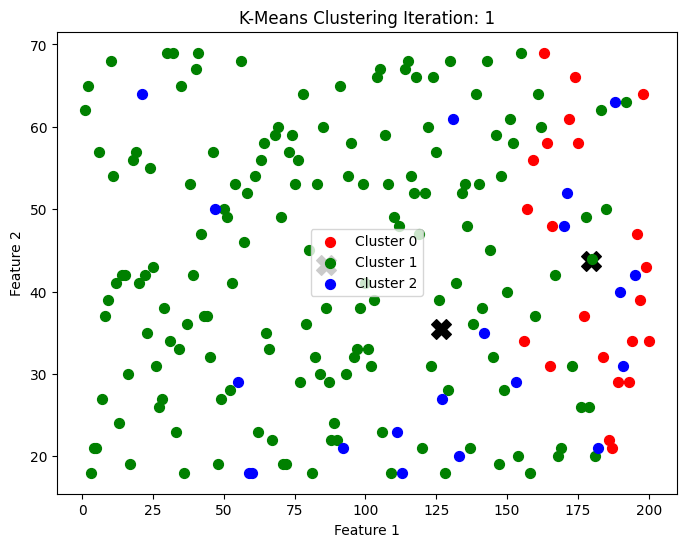

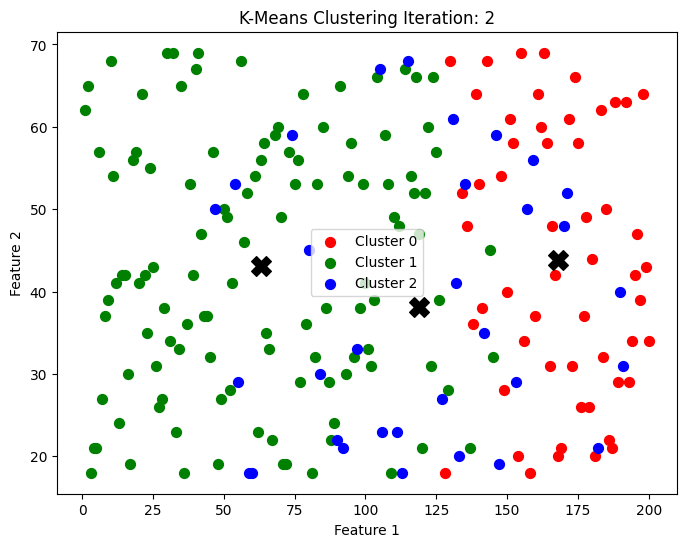

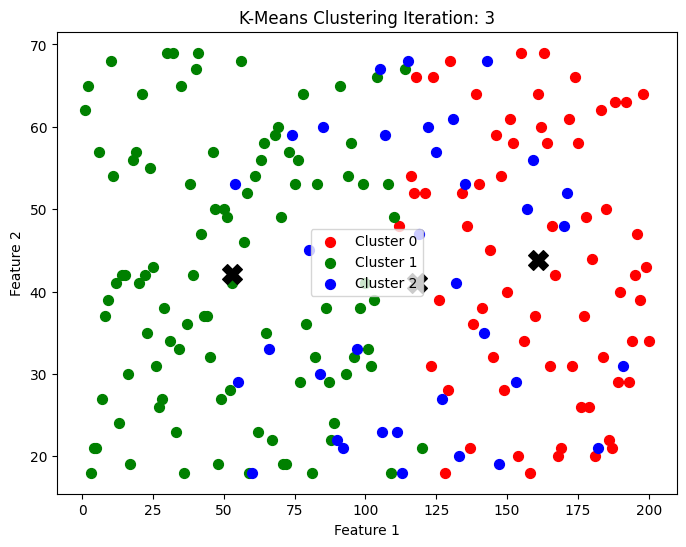

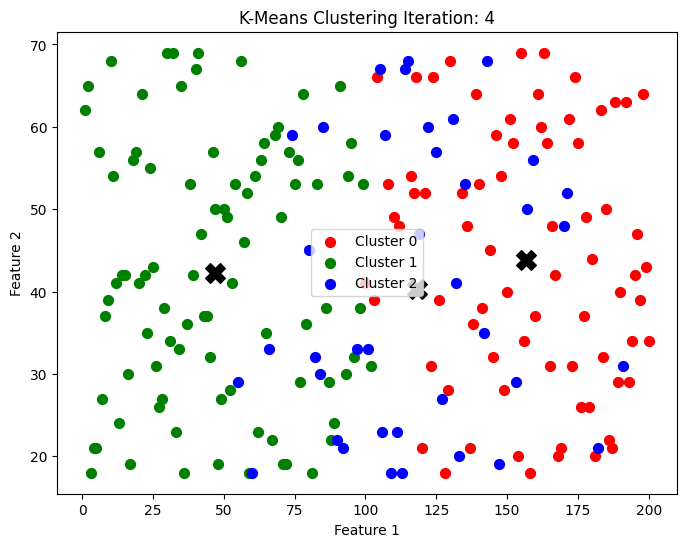

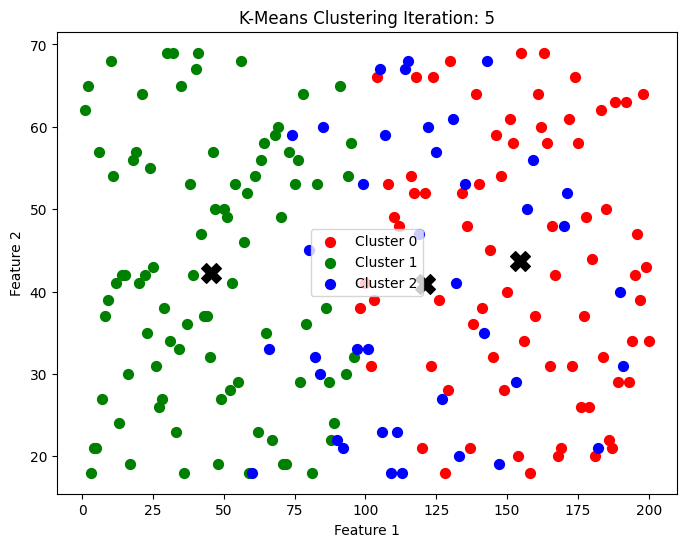

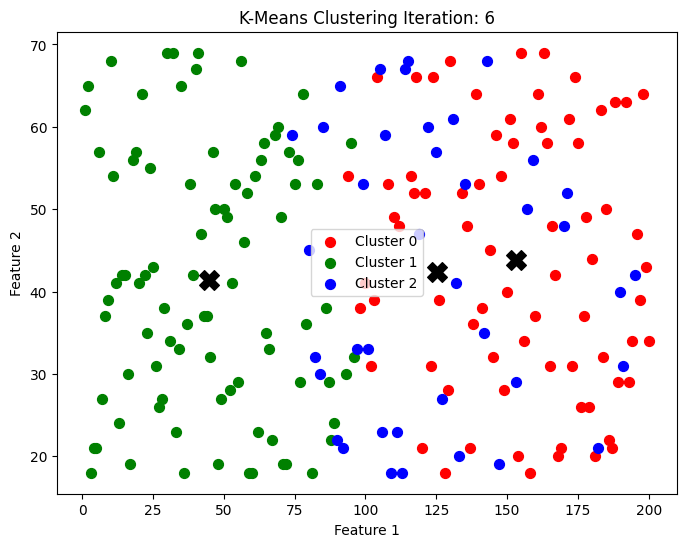

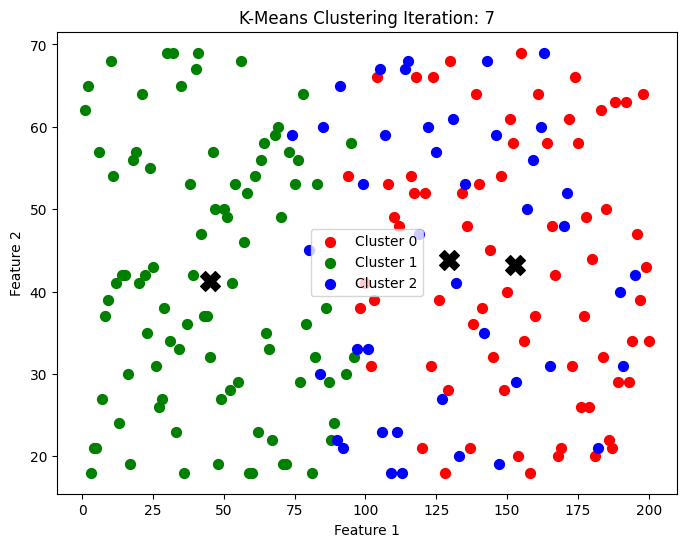

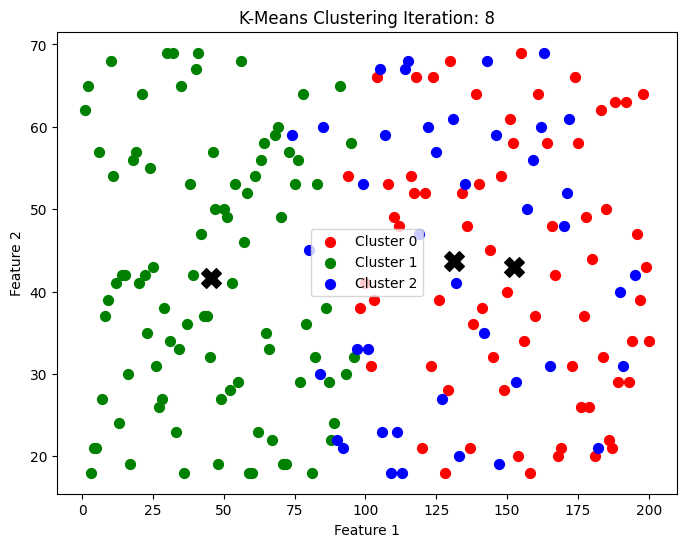

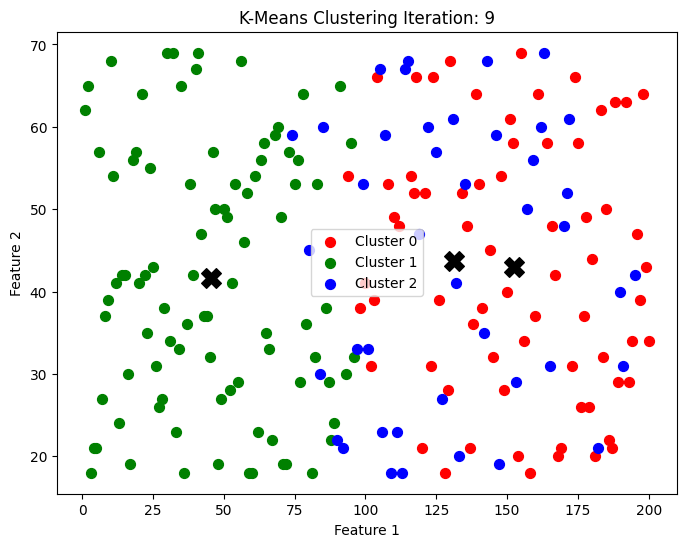

In [37]:
def initialize_kmeans_plusplus(data, k):
    """
    Initialize centroids using the K-Means++ algorithm.
    """
    n_samples, n_features = data.shape
    centroids = np.zeros((k, n_features))
    first_centroid_idx = np.random.randint(0, n_samples)
    centroids[0] = data[first_centroid_idx]

    for centroid_idx in range(1, k):
        distances = np.array([min([np.linalg.norm(data[i] - c) for c in centroids[:centroid_idx]]) for i in range(n_samples)])
        probabilities = distances / distances.sum()
        cumulative_probabilities = np.cumsum(probabilities)
        next_centroid_idx = np.searchsorted(cumulative_probabilities, np.random.random())
        centroids[centroid_idx] = data[next_centroid_idx]

    return centroids

def expectation_step(data, centroids):
    """
    Assigns each data point to the closest centroid.
    """
    clusters = []
    for point in data:
        distances = np.linalg.norm(point - centroids, axis=1)
        closest_centroid = np.argmin(distances)
        clusters.append(closest_centroid)
    return np.array(clusters)

def maximization_step(data, clusters, k):
    """
    Updates the centroids to be the mean of the points in each cluster.
    """
    n_features = data.shape[1]
    centroids = np.zeros((k, n_features))
    for i in range(k):
        points_in_cluster = data[clusters == i]
        centroids[i] = points_in_cluster.mean(axis=0) if len(points_in_cluster) > 0 else np.random.rand(n_features)
    return centroids

def plot_clusters(data, centroids, clusters, iteration, k):
    """
    Plots the data points and centroids.
    """
    plt.figure(figsize=(8, 6))
    colors = ['r', 'g', 'b', 'y', 'c', 'm']
    for i in range(k):
        points = data[clusters == i]
        plt.scatter(points[:, 0], points[:, 1], s=50, c=colors[i], label=f'Cluster {i}')
        plt.scatter(centroids[i, 0], centroids[i, 1], s=200, c='black', marker='X')
    plt.title(f"K-Means Clustering Iteration: {iteration}")
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()

def kmeans(data, k, max_iterations=100):
    """
    Applies the K-Means clustering algorithm.
    """
    centroids = initialize_kmeans_plusplus(data, k)
    for iteration in range(max_iterations):
        old_centroids = centroids.copy()
        clusters = expectation_step(data, centroids)
        centroids = maximization_step(data, clusters, k)

        # Plot each iteration
        plot_clusters(data, centroids, clusters, iteration + 1, k)

        # Check for convergence (centroids do not change)
        if np.all(centroids == old_centroids):
            break
    return centroids, clusters

# Example usage
np.random.seed(0)  # For reproducibility
data = np.random.rand(100, 2)  # 100 points in 2D
k = 3  # Number of clusters

# Run K-Means
final_centroids, final_clusters = kmeans(numpy_array, k)

# Note: The plot_clusters function will show each iteration. It can generate many plots if max_iterations is high.


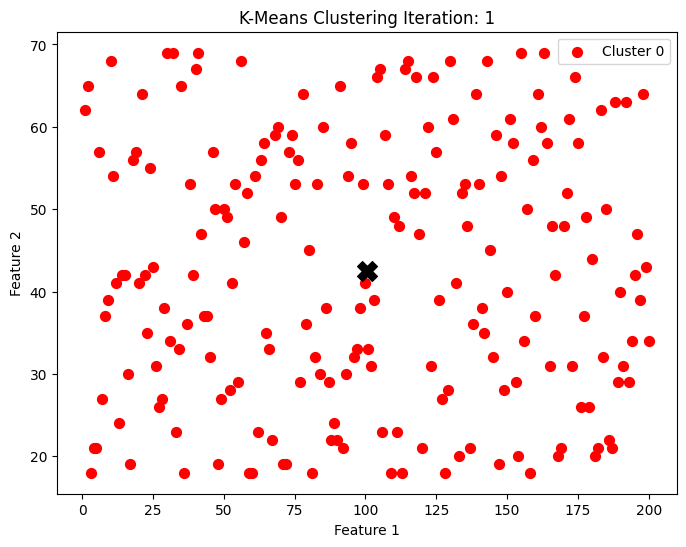

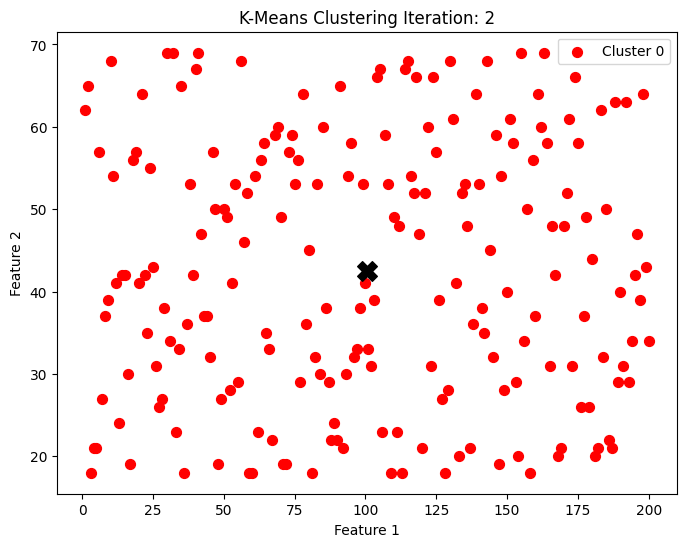

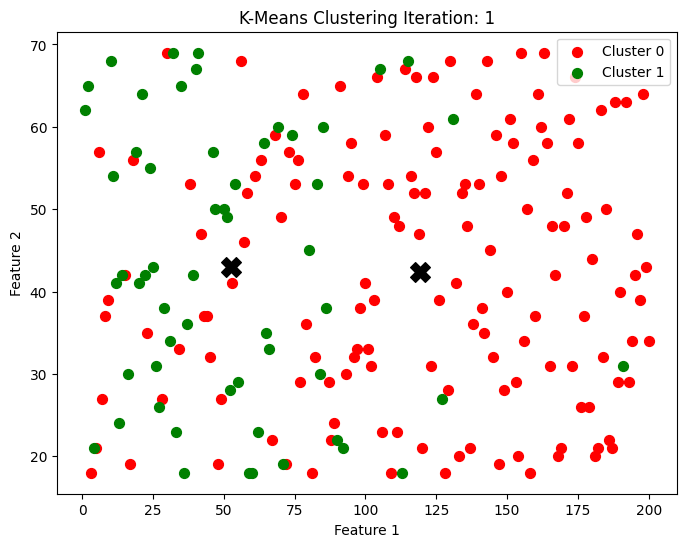

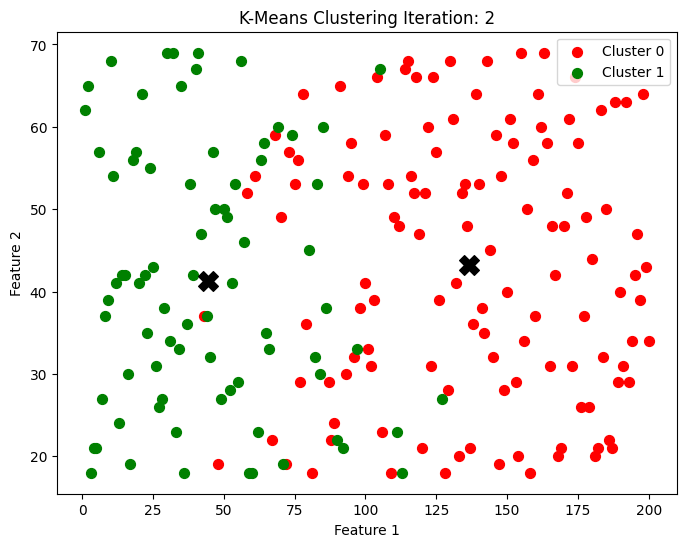

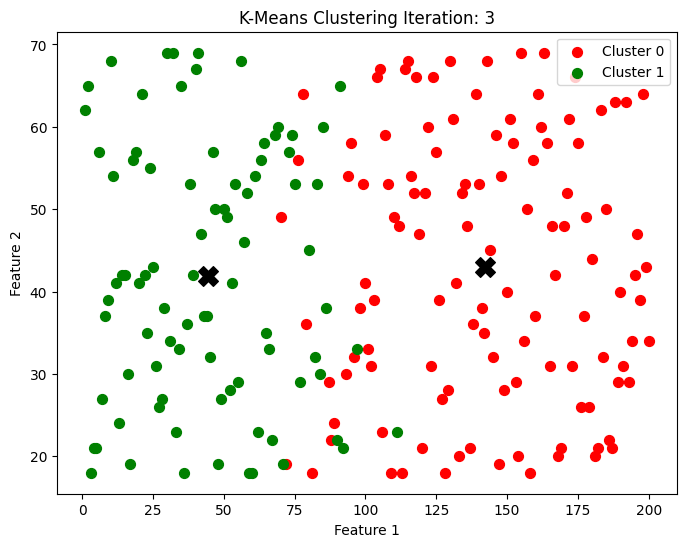

...

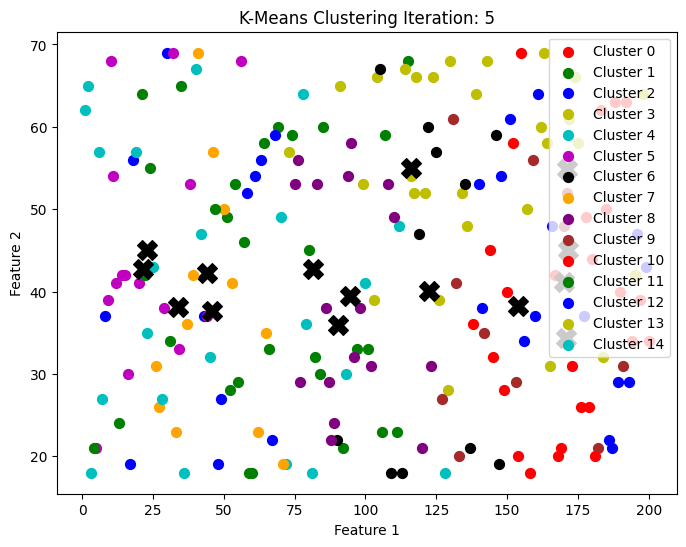

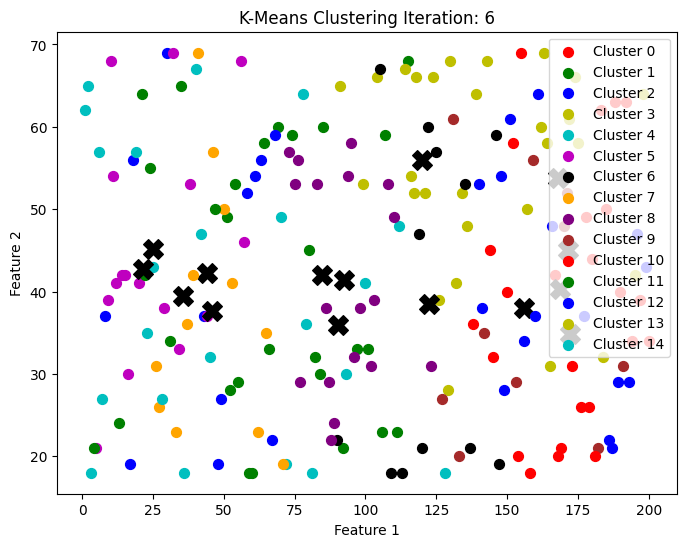

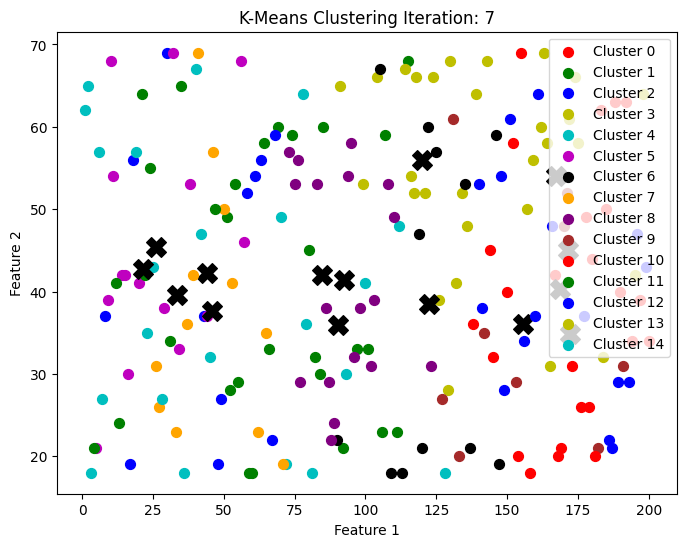

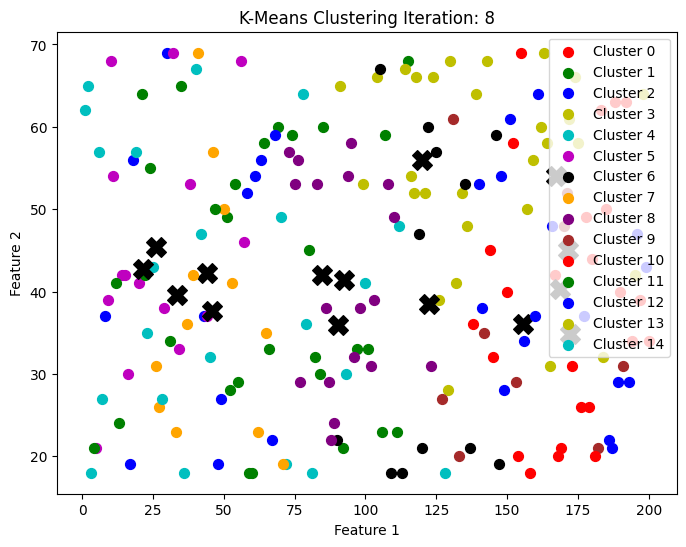

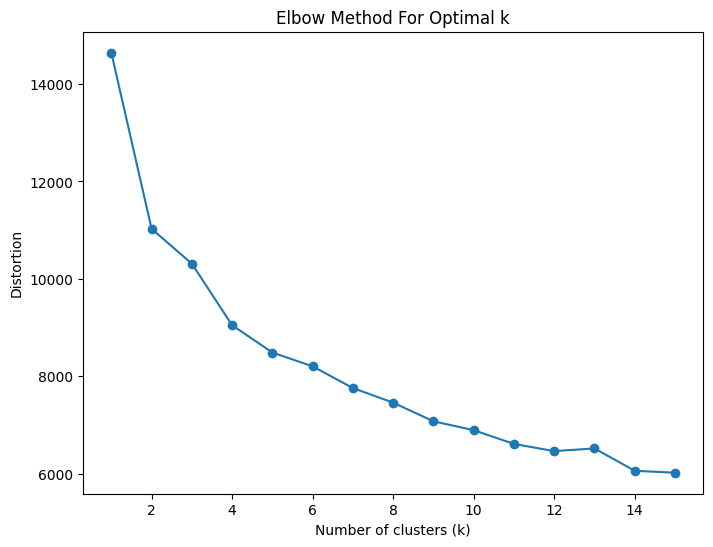

In [43]:
# Updating the plot_clusters function to handle more clusters
def plot_clusters(data, centroids, clusters, iteration, k):
    """
    Plots the data points and centroids.
    """
    plt.figure(figsize=(8, 6))
    colors = itertools.cycle(['r', 'g', 'b', 'y', 'c', 'm', 'k', 'orange', 'purple', 'brown'])
    for i in range(k):
        points = data[clusters == i]
        color = next(colors)
        plt.scatter(points[:, 0], points[:, 1], s=50, c=color, label=f'Cluster {i}')
        plt.scatter(centroids[i, 0], centroids[i, 1], s=200, c='black', marker='X')
    plt.title(f"K-Means Clustering Iteration: {iteration}")
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()

# Re-running the elbow method
max_k = 15
distortions = compute_elbow_method(numpy_array, max_k)

# Plotting the elbow method
plt.figure(figsize=(8, 6))
plt.plot(range(1, max_k + 1), distortions, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Distortion')
plt.title('Elbow Method For Optimal k')
plt.show()


In [44]:
def find_optimal_k_elbow_method(distortions):
    """
    Finds the optimal number of clusters (k) using the elbow method by identifying the point 
    where the distortion/inertia starts decreasing at a slower rate.

    Parameters:
    distortions (List): List of distortions for each value of k.

    Returns:
    int: Optimal value of k based on the elbow method.
    """
    # Calculate the second derivative (rate of change of the rate of change) of the distortions
    second_derivative = np.diff(distortions, 2)

    # The optimal k is where the second derivative is maximum (elbow point)
    optimal_k = np.argmin(second_derivative) + 2  # +2 because the second derivative is shorter by 2 elements

    return optimal_k

# Finding the optimal k using the elbow method
optimal_k = find_optimal_k_elbow_method(distortions)

optimal_k, distortions


(3,
 [14642.73064268145,
  11027.296341595675,
  10312.17423709282,
  9048.640053128567,
  8488.475301631766,
  8204.565346671288,
  7758.982557787052,
  7459.400031461434,
  7076.659778078406,
  6894.607606586625,
  6612.063283948608,
  6464.2019187660035,
  6519.716516940878,
  6060.908384837377,
  6020.872646421014])

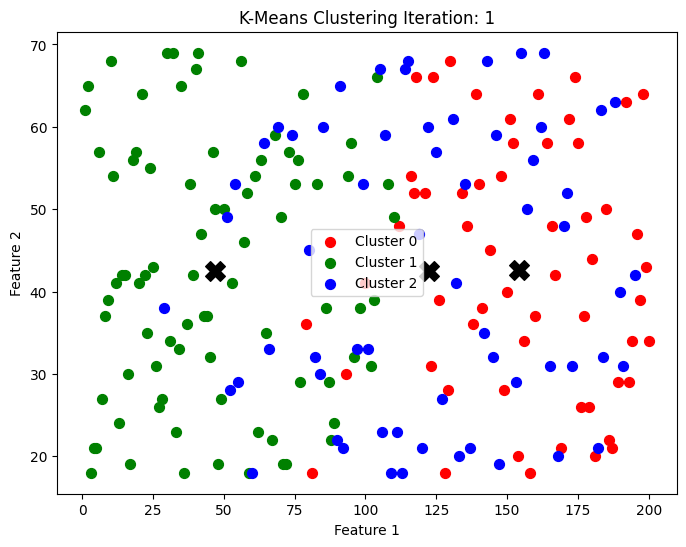

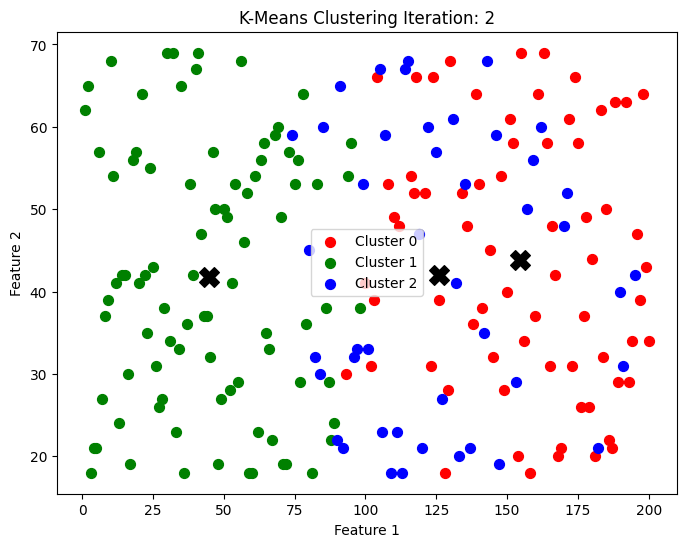

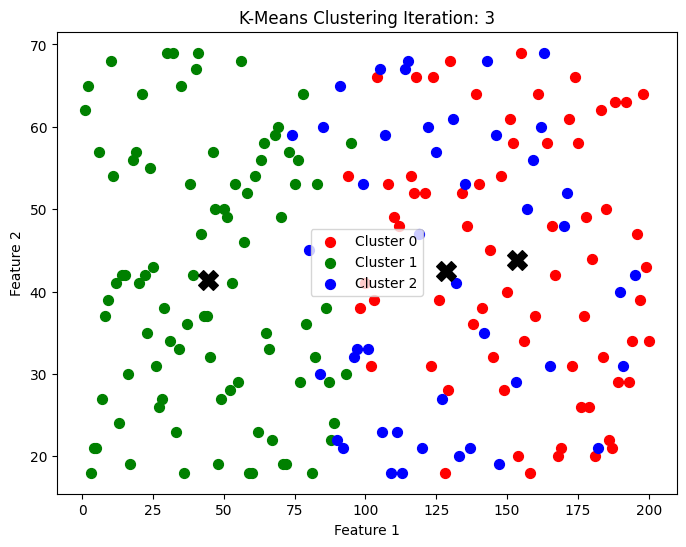

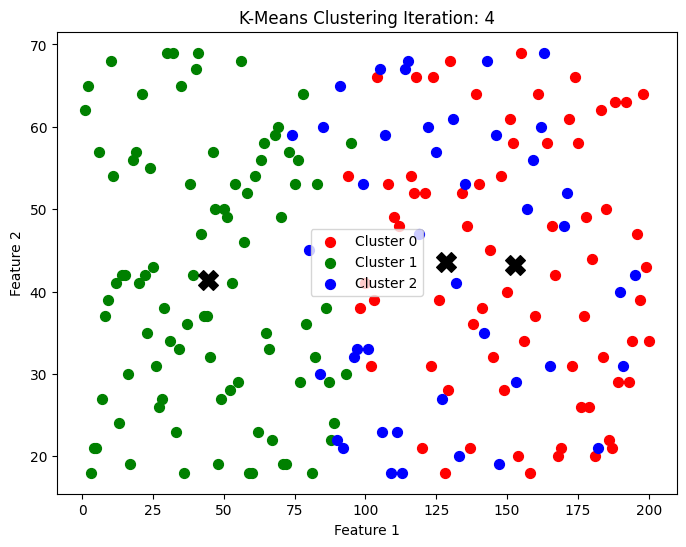

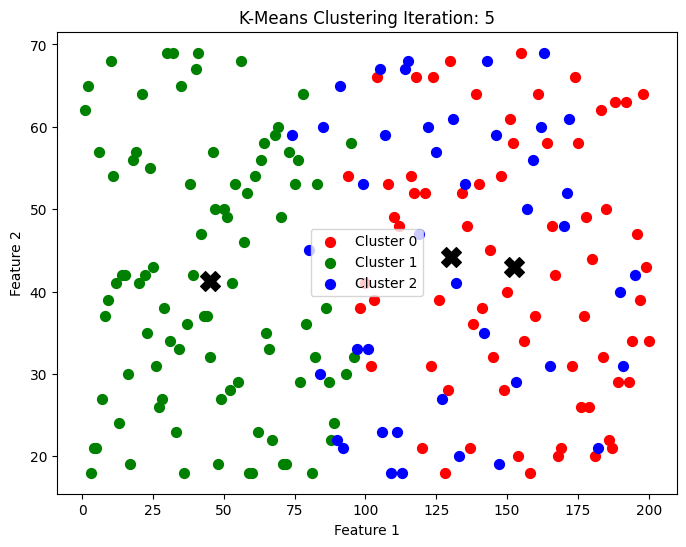

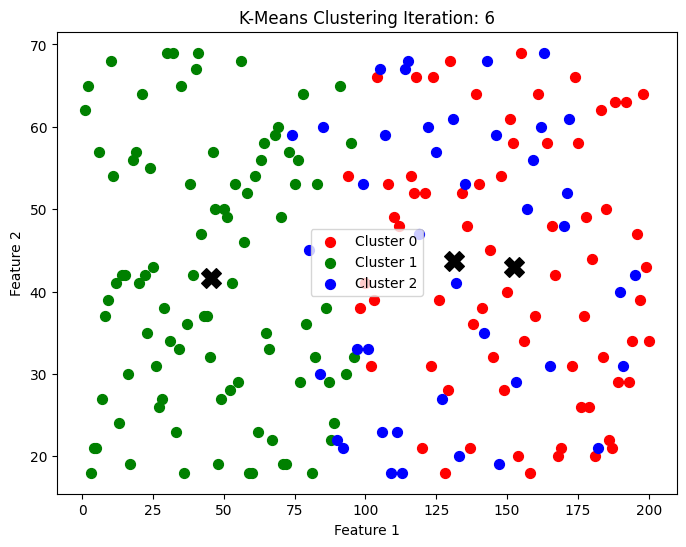

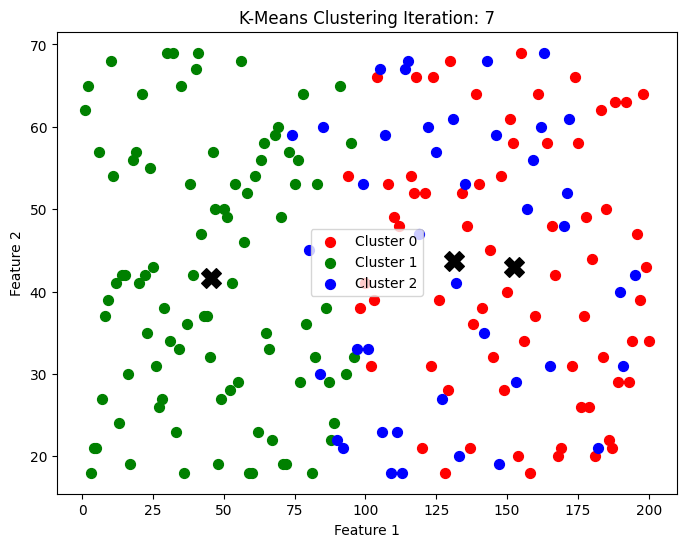

Custom Implementation Centroids:
 [[152.5942029   42.95652174   0.43478261 115.01449275  45.39130435
    2.65217391]
 [ 45.58426966  41.58426966   0.39325843  80.14606742  49.01123596
    2.80898876]
 [131.28571429  43.71428571   0.5         47.92857143  45.9047619
    3.16666667]]
Sklearn Implementation Centroids:
 [[ 79.01851852  41.11111111   0.5        118.12962963  49.5
    2.74074074]
 [160.2         44.0375       0.4375      89.7875      44.2
    2.9       ]
 [ 45.71212121  41.78787879   0.36363636  53.33333333  48.68181818
    2.81818182]]
Adjusted Rand Index (similarity of cluster assignments): 0.3392599193282854
Custom Implementation Inertia: 10117.713375037114
Sklearn Implementation Inertia: 534835.1766414142


/Users/edvardghukasyan/PycharmProjects/experience/venv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [57]:
# Run custom K-Means
custom_centroids, custom_clusters = kmeans(numpy_array, optimal_k)

# Run sklearn K-Means
kmeans_sklearn = KMeans(n_clusters=optimal_k, init='k-means++', random_state=0)
sklearn_clusters = kmeans_sklearn.fit_predict(numpy_array)
sklearn_centroids = kmeans_sklearn.cluster_centers_

# Compare centroids
print("Custom Implementation Centroids:\n", custom_centroids)
print("Sklearn Implementation Centroids:\n", sklearn_centroids)

# Compare cluster assignments
adjusted_rand_index = adjusted_rand_score(custom_clusters, sklearn_clusters)
print("Adjusted Rand Index (similarity of cluster assignments):", adjusted_rand_index)

# Compare inertia
print("Custom Implementation Inertia:", np.sum(np.min(np.linalg.norm(numpy_array[:, np.newaxis] - custom_centroids, axis=2), axis=1)))
print("Sklearn Implementation Inertia:", kmeans_sklearn.inertia_)


In [59]:
def test_new_points_kmeans(final_centroids, new_points):
    """
    Tests the K-Means algorithm on new data points after training on a given dataset.

    Parameters:
    data (np.array): The dataset used to train the K-Means model.
    new_points (np.array): New data points to test the model.
    k (int): Number of clusters.

    Returns:
    np.array: Cluster assignments for the new data points.
    """
    # Train K-Means on the provided data
    centroids = final_centroids

    # Assign new points to the nearest centroids
    new_clusters = []
    for point in new_points:
        distances = np.linalg.norm(point - centroids, axis=1)
        closest_centroid = np.argmin(distances)
        new_clusters.append(closest_centroid)

    return np.array(new_clusters)

# Example usage
# Assuming you have a dataset (data) and you want to test new data points (new_points)
# new_points = ... (Your new data points)
# k = 4  # Example number of clusters
# cluster_assignments = test_new_points_kmeans(data, new_points, k)
# print(cluster_assignments)


In [65]:
# Generating synthetic new points for testing
# Assuming the structure of the data and the types of columns from the provided information

# Number of new points to generate
num_new_points = 10

# Generating data similar to the training data structure
new_data = {
    'ID': range(201, 201 + num_new_points),  # Continuing IDs from 201
    'Age': np.random.randint(18, 70, size=num_new_points),  # Age between 18 and 70
    'Gender': np.random.choice(['Male', 'Female'], size=num_new_points),  # Random genders
    'Annual Income (k$)': np.random.randint(15, 150, size=num_new_points),  # Income between 15k$ and 150k$
    'Spending Score (1-100)': np.random.randint(1, 101, size=num_new_points),  # Score between 1 and 100
    'Product Category Preference': np.random.choice(['Electronics', 'Clothing', 'Groceries', 'Home & Living', 'Health & Beauty'], size=num_new_points)  # Random product preferences
}

# Creating a DataFrame for new points
new_points = pd.DataFrame(new_data)

new_points = new_points.values